In [1]:
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import scanpy as sc
import squidpy as sq
import argparse
import gpflow
import tensorflow as tf
import statsmodels.formula.api as smf 
import statsmodels.api as sm
import simstpy as sim


In [2]:
import os
os.chdir(os.path.expanduser('~/GPcounts/GPcounts'))
from GPcounts.RNA_seq_GP import rna_seq_gp


In [3]:
Y = pd.read_csv(r"C:\Users\User\GPcounts\ut_A1_stdata_filtered.tsv", index_col=[0], sep="\t")


In [4]:
import numpy as np
import matplotlib.pyplot as plt

import scipy.stats as stats
from scipy.stats import normaltest, kstest, shapiro

In [5]:
p_val_list = pd.DataFrame()
for i in range(len(Y)):
    stat, p_val = normaltest(Y.iloc[:, i])


In [6]:
Y = Y.T[Y.sum(0) >= 3].T

In [7]:
spatial_locations = pd.DataFrame(index=Y.index)
spatial_locations['x'] = Y.index.str.split('x').str.get(0).map(float)
spatial_locations['y'] = Y.index.str.split('x').str.get(1).map(float)
spatial_locations['total_counts'] = Y.sum(1)

spatial_locations

,x,y,total_counts
10x13,10.0,13.0,12269
10x14,10.0,14.0,3357
10x15,10.0,15.0,4178
10x16,10.0,16.0,5871
10x17,10.0,17.0,3818
...,...,...,...
9x23,9.0,23.0,2899
9x24,9.0,24.0,5247
9x25,9.0,25.0,6555
9x26,9.0,26.0,4360


In [8]:
Y

,FO538757.1,SAMD11,NOC2L,KLHL17,PLEKHN1,PERM1,HES4,ISG15,AGRN,RNF223,...,DKC1,MPP1,F8,F8A1,FUNDC2,BRCC3,VBP1,CLIC2,SPRY3,VAMP7
10x13,0,6,1,0,0,0,2,0,0,0,...,0,0,0,0,1,0,0,0,0,1
10x14,0,6,3,1,0,0,3,0,1,0,...,0,0,0,0,0,0,1,0,0,0
10x15,1,1,0,0,0,0,6,1,2,0,...,0,0,0,0,0,0,0,0,0,0
10x16,0,6,1,0,0,0,3,0,0,0,...,0,1,0,0,0,0,1,0,0,0
10x17,0,1,2,0,0,0,4,0,1,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9x23,1,1,0,0,0,0,3,0,0,0,...,0,0,0,0,0,0,1,0,0,0
9x24,0,1,5,1,0,0,1,1,0,0,...,0,0,0,0,0,0,0,0,0,0
9x25,0,3,1,0,0,0,8,0,1,0,...,0,0,0,0,0,0,0,0,0,0
9x26,0,2,2,0,0,0,4,0,0,0,...,1,1,0,0,1,0,0,0,0,0


In [9]:
scales = []
for i in range(0, len(Y.columns)):
    model=smf.glm(formula = "Y.iloc[:, i]~0+spatial_locations['total_counts']", 
                  data=Y, 
                  family=sm.families.NegativeBinomial(sm.families.links.identity())).fit()
    res = model.params[0]*spatial_locations['total_counts']
    scales.append(res)
scalesdf=pd.DataFrame(scales)
scalesdf=scalesdf.T

c:\Users\User\GPcounts\.venv\lib\site-packages\statsmodels\genmod\families\links.py:13: FutureWarning: The identity link alias is deprecated. Use Identity instead. The identity link alias will be removed after the 0.15.0 release.
  warnings.warn(
c:\Users\User\GPcounts\.venv\lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
c:\Users\User\GPcounts\.venv\lib\site-packages\statsmodels\genmod\generalized_linear_model.py:308: DomainWarning: The identity link function does not respect the domain of the NegativeBinomial family.
  warnings.warn((f"The {type(family.link).__name__} link function "
C:\Users\User\AppData\Local\Temp\ipykernel_21752\2035937787.py:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with 

In [10]:
Y1 = Y.T
X = spatial_locations[['x', 'y']]


In [11]:
Y_run = Y1.iloc[0:20,:]
gene_name = Y_run.index

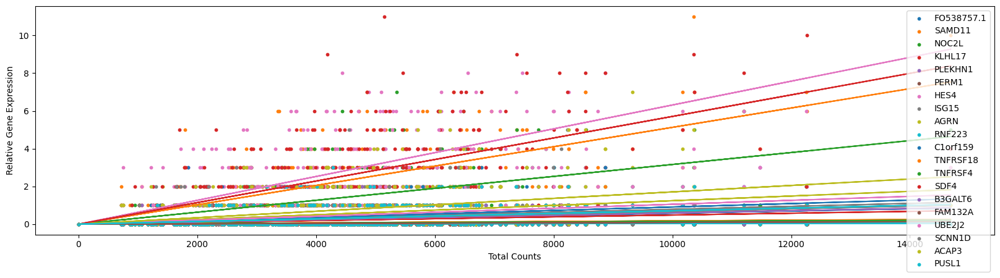

In [12]:
plt.figure().set_figwidth(20)
plt.xlabel("Total Counts")
plt.ylabel("Relative Gene Expression")
for i in range(0, len(Y_run.T.columns)):
    plt.scatter(spatial_locations['total_counts'], Y_run.iloc[i],s=10, label=Y_run.index[i])
    plt.plot(spatial_locations['total_counts'], scalesdf.T.iloc[i])

    plt.legend()
plt.show()

In [13]:
gp_counts = rna_seq_gp(X, Y_run.loc[gene_name],  sparse=True,scale = scalesdf, safe_mode=False)


In [14]:
gp_counts.check()

local check


In [15]:
log_likelihood_ratio = gp_counts.One_sample_test("Negative_binomial")


  0%|          | 0/20 [00:00<?, ?it/s]

[[ 8. 24.]
 [21. 14.]
 [12. 17.]
 [22. 22.]
 [ 3. 14.]
 [15. 27.]
 [ 3. 20.]
 [26. 17.]
 [16. 21.]
 [24. 27.]
 [16. 12.]
 [ 5. 28.]
 [ 9. 13.]
 [26. 12.]
 [ 7. 18.]
 [10. 28.]
 [18. 17.]]
model 1 log likelihood = -210.11123865249252, alpha = 1.2699648379719283e-06, km = None
[[ 8. 24.]
 [13. 27.]
 [ 7. 27.]
 [12. 27.]
 [20. 27.]
 [21. 14.]
 [10. 19.]
 [24. 14.]
 [20. 13.]
 [13. 22.]
 [22. 12.]
 [12. 17.]
 [13. 23.]
 [20. 14.]
 [16. 17.]
 [15. 21.]
 [26. 14.]]
lik_alpha: None
[[19. 21.]
 [20. 24.]
 [15. 22.]
 [ 6. 24.]
 [ 6. 23.]
 [19. 15.]
 [ 9. 17.]
 [ 8. 21.]
 [ 8. 25.]
 [ 5. 25.]
 [24. 17.]
 [21. 13.]
 [16. 26.]
 [18. 13.]
 [17. 23.]
 [ 9. 18.]
 [21. 19.]]


  5%|▌         | 1/20 [00:33<10:34, 33.41s/it]

results: [-210.11123865249252, -210.1112313591759, -7.293316627965396e-06]
[[ 8. 24.]
 [21. 14.]
 [12. 17.]
 [22. 22.]
 [ 3. 14.]
 [15. 27.]
 [ 3. 20.]
 [26. 17.]
 [16. 21.]
 [24. 27.]
 [16. 12.]
 [ 5. 28.]
 [ 9. 13.]
 [26. 12.]
 [ 7. 18.]
 [10. 28.]
 [18. 17.]]
lik_alpha: None
[[19. 21.]
 [ 3. 14.]
 [ 6. 28.]
 [26. 12.]
 [13. 12.]
 [10. 20.]
 [24. 27.]
 [14. 28.]
 [26. 19.]
 [ 3. 21.]
 [19. 14.]
 [ 8. 14.]
 [19. 27.]
 [15. 18.]
 [14. 23.]
 [ 9. 25.]
 [23. 16.]]
model 1 log likelihood = -594.1209287435402, alpha = 3.3953578455417245e-05, km = None
[[ 8. 24.]
 [13. 27.]
 [ 7. 27.]
 [21. 14.]
 [10. 19.]
 [24. 14.]
 [20. 13.]
 [13. 22.]
 [22. 12.]
 [12. 17.]
 [13. 23.]
 [20. 14.]
 [16. 17.]
 [12. 27.]
 [20. 27.]
 [15. 21.]
 [26. 14.]]


 10%|█         | 2/20 [00:55<07:56, 26.46s/it]

results: [-594.1209287435402, -597.6831019365989, 3.5621731930586975]
[[ 8. 24.]
 [21. 14.]
 [12. 17.]
 [22. 22.]
 [ 3. 14.]
 [16. 27.]
 [ 3. 20.]
 [26. 17.]
 [16. 21.]
 [24. 27.]
 [16. 12.]
 [ 5. 28.]
 [ 9. 13.]
 [26. 12.]
 [11. 28.]
 [ 7. 18.]
 [18. 17.]]
model 1 log likelihood = -499.3565444438017, alpha = 0.0301849818401767, km = None
[[ 8. 24.]
 [13. 27.]
 [ 7. 27.]
 [21. 14.]
 [10. 19.]
 [24. 14.]
 [20. 13.]
 [13. 22.]
 [22. 12.]
 [12. 17.]
 [13. 23.]
 [20. 14.]
 [16. 17.]
 [15. 21.]
 [26. 14.]
 [26. 16.]
 [16. 21.]]


 15%|█▌        | 3/20 [01:06<05:34, 19.69s/it]

results: [-499.3565444438017, -499.3565444071056, -3.6696064853458665e-08]
[[ 8. 24.]
 [21. 14.]
 [12. 17.]
 [22. 22.]
 [ 3. 14.]
 [16. 27.]
 [ 3. 20.]
 [26. 17.]
 [16. 21.]
 [24. 27.]
 [16. 12.]
 [ 5. 28.]
 [ 9. 13.]
 [26. 12.]
 [11. 28.]
 [ 7. 18.]
 [18. 17.]]
model 1 log likelihood = -187.21363734650694, alpha = 0.1951119609579899, km = None
[[ 8. 24.]
 [13. 27.]
 [ 7. 27.]
 [21. 14.]
 [10. 19.]
 [24. 14.]
 [20. 13.]
 [13. 22.]
 [22. 12.]
 [12. 17.]
 [13. 23.]
 [20. 14.]
 [16. 17.]
 [12. 27.]
 [20. 27.]
 [15. 21.]
 [26. 14.]]


 20%|██        | 4/20 [01:18<04:25, 16.60s/it]

results: [-187.21363734650694, -187.21364036456103, 3.0180540875335282e-06]
[[ 8. 24.]
 [21. 14.]
 [12. 17.]
 [22. 22.]
 [ 3. 14.]
 [15. 27.]
 [ 3. 20.]
 [26. 17.]
 [16. 21.]
 [24. 27.]
 [16. 12.]
 [ 5. 28.]
 [ 9. 13.]
 [26. 12.]
 [ 7. 18.]
 [10. 28.]
 [18. 17.]]
lik_alpha: None
[[19. 21.]
 [ 3. 14.]
 [ 6. 28.]
 [26. 12.]
 [13. 12.]
 [10. 20.]
 [24. 27.]
 [14. 28.]
 [26. 19.]
 [ 3. 21.]
 [19. 14.]
 [ 8. 14.]
 [19. 27.]
 [15. 18.]
 [14. 23.]
 [ 9. 25.]
 [23. 16.]]
[[11. 22.]
 [26. 12.]
 [25. 26.]
 [ 3. 14.]
 [16. 12.]
 [ 5. 28.]
 [20. 19.]
 [17. 27.]
 [ 3. 21.]
 [10. 15.]
 [26. 19.]
 [11. 28.]
 [15. 18.]
 [21. 12.]
 [21. 24.]
 [ 7. 19.]
 [16. 23.]]
model 1 log likelihood = -61.361533484078194, alpha = 3.678822928967265e-08, km = None
[[ 8. 24.]
 [13. 27.]
 [ 7. 27.]
 [21. 14.]
 [10. 19.]
 [12. 27.]
 [20. 27.]
 [24. 14.]
 [20. 13.]
 [13. 22.]
 [22. 12.]
 [12. 17.]
 [13. 23.]
 [20. 14.]
 [16. 17.]
 [15. 21.]
 [26. 14.]]


 25%|██▌       | 5/20 [01:42<04:51, 19.44s/it]

results: [-61.361533484078194, -61.36153993917917, 6.455100972857508e-06]
[[ 8. 24.]
 [21. 14.]
 [12. 17.]
 [22. 22.]
 [ 3. 14.]
 [16. 27.]
 [ 3. 20.]
 [26. 17.]
 [16. 21.]
 [24. 27.]
 [16. 12.]
 [ 5. 28.]
 [ 9. 13.]
 [26. 12.]
 [11. 28.]
 [ 7. 18.]
 [18. 17.]]
model 1 log likelihood = -26.714911301568772, alpha = 3.355044001529392e-06, km = None
[[ 8. 24.]
 [13. 27.]
 [ 7. 27.]
 [21. 14.]
 [10. 19.]
 [24. 14.]
 [20. 13.]
 [13. 22.]
 [22. 12.]
 [12. 17.]
 [13. 23.]
 [20. 14.]
 [16. 17.]
 [15. 21.]
 [26. 14.]
 [26. 16.]
 [16. 21.]]


 30%|███       | 6/20 [01:53<03:47, 16.27s/it]

results: [-26.714911301568772, -26.714911295182155, -6.386617457110333e-09]
[[ 8. 24.]
 [21. 14.]
 [12. 17.]
 [22. 22.]
 [ 3. 14.]
 [16. 27.]
 [ 3. 20.]
 [26. 17.]
 [16. 21.]
 [24. 27.]
 [16. 12.]
 [ 5. 28.]
 [ 9. 13.]
 [26. 12.]
 [11. 28.]
 [ 7. 18.]
 [18. 17.]]
model 1 log likelihood = -649.8113035122195, alpha = 0.04656933267286774, km = None
[[ 8. 24.]
 [13. 27.]
 [ 7. 27.]
 [21. 14.]
 [10. 19.]
 [24. 14.]
 [20. 13.]
 [13. 22.]
 [22. 12.]
 [12. 17.]
 [13. 23.]
 [20. 14.]
 [16. 17.]
 [15. 21.]
 [26. 14.]
 [26. 16.]
 [16. 21.]]


 35%|███▌      | 7/20 [02:03<03:06, 14.32s/it]

results: [-649.8113035122195, -649.8081741309206, -0.003129381298890621]
[[ 8. 24.]
 [21. 14.]
 [12. 17.]
 [22. 22.]
 [ 3. 14.]
 [15. 27.]
 [ 3. 20.]
 [26. 17.]
 [16. 21.]
 [24. 27.]
 [16. 12.]
 [ 5. 28.]
 [ 9. 13.]
 [26. 12.]
 [ 7. 18.]
 [10. 28.]
 [18. 17.]]
model 1 log likelihood = -258.4195010764001, alpha = 0.5520744300159438, km = None
[[ 8. 24.]
 [13. 27.]
 [ 7. 27.]
 [21. 14.]
 [10. 19.]
 [12. 27.]
 [20. 27.]
 [24. 14.]
 [20. 13.]
 [13. 22.]
 [22. 12.]
 [12. 17.]
 [13. 23.]
 [20. 14.]
 [16. 17.]
 [15. 21.]
 [26. 14.]]


 40%|████      | 8/20 [02:14<02:41, 13.44s/it]

results: [-258.4195010764001, -265.539643226494, 7.120142150093898]
[[ 8. 24.]
 [21. 14.]
 [12. 17.]
 [22. 22.]
 [ 3. 14.]
 [15. 27.]
 [ 3. 20.]
 [26. 17.]
 [16. 21.]
 [24. 27.]
 [16. 12.]
 [ 5. 28.]
 [ 9. 13.]
 [26. 12.]
 [ 7. 18.]
 [10. 28.]
 [18. 17.]]
model 1 log likelihood = -316.64582941654146, alpha = 0.42728996094989763, km = None
[[ 8. 24.]
 [13. 27.]
 [ 7. 27.]
 [21. 14.]
 [10. 19.]
 [24. 14.]
 [20. 13.]
 [13. 22.]
 [22. 12.]
 [12. 27.]
 [20. 27.]
 [12. 17.]
 [13. 23.]
 [20. 14.]
 [16. 17.]
 [15. 21.]
 [26. 14.]]


 45%|████▌     | 9/20 [02:32<02:42, 14.80s/it]

results: [-316.64582941654146, -336.33688511495046, 19.691055698409002]
[[ 8. 24.]
 [21. 14.]
 [12. 17.]
 [22. 22.]
 [ 3. 14.]
 [16. 27.]
 [ 3. 20.]
 [26. 17.]
 [16. 21.]
 [24. 27.]
 [16. 12.]
 [ 5. 28.]
 [ 9. 13.]
 [26. 12.]
 [11. 28.]
 [ 7. 18.]
 [18. 17.]]
model 1 log likelihood = -25.34737699567801, alpha = 2.675844500712746e-07, km = None
[[ 8. 24.]
 [13. 27.]
 [ 7. 27.]
 [21. 14.]
 [10. 19.]
 [24. 14.]
 [20. 13.]
 [13. 22.]
 [22. 12.]
 [12. 17.]
 [13. 23.]
 [20. 14.]
 [16. 17.]
 [15. 21.]
 [26. 14.]
 [26. 16.]
 [16. 21.]]


 50%|█████     | 10/20 [02:45<02:22, 14.25s/it]

results: [-25.34737699567801, -25.34737761351012, 6.17832107252525e-07]
[[ 8. 24.]
 [21. 14.]
 [12. 17.]
 [22. 22.]
 [ 3. 14.]
 [16. 27.]
 [ 3. 20.]
 [26. 17.]
 [16. 21.]
 [24. 27.]
 [16. 12.]
 [ 5. 28.]
 [ 9. 13.]
 [26. 12.]
 [11. 28.]
 [ 7. 18.]
 [18. 17.]]
model 1 log likelihood = -268.8616256760394, alpha = 1.1682601846629884e-07, km = None
[[ 8. 24.]
 [13. 27.]
 [ 7. 27.]
 [21. 14.]
 [10. 19.]
 [24. 14.]
 [20. 13.]
 [13. 22.]
 [22. 12.]
 [12. 17.]
 [13. 23.]
 [20. 14.]
 [16. 17.]
 [15. 21.]
 [26. 14.]
 [26. 16.]
 [16. 21.]]


 55%|█████▌    | 11/20 [02:59<02:05, 13.95s/it]

results: [-268.8616256760394, -279.3894760084615, 10.527850332422076]
[[ 8. 24.]
 [21. 14.]
 [12. 17.]
 [22. 22.]
 [ 3. 14.]
 [15. 27.]
 [ 3. 20.]
 [26. 17.]
 [16. 21.]
 [24. 27.]
 [16. 12.]
 [ 5. 28.]
 [ 9. 13.]
 [26. 12.]
 [ 7. 18.]
 [10. 28.]
 [18. 17.]]
model 1 log likelihood = -85.72429490670679, alpha = 6.771598738251674e-06, km = None
[[ 8. 24.]
 [13. 27.]
 [ 7. 27.]
 [21. 14.]
 [10. 19.]
 [24. 14.]
 [20. 13.]
 [13. 22.]
 [22. 12.]
 [12. 17.]
 [13. 23.]
 [20. 14.]
 [16. 17.]
 [12. 27.]
 [20. 27.]
 [15. 21.]
 [26. 14.]]


 60%|██████    | 12/20 [03:13<01:52, 14.08s/it]

results: [-85.72429490670679, -93.91682398421702, 8.19252907751023]
[[ 8. 24.]
 [21. 14.]
 [12. 17.]
 [22. 22.]
 [ 3. 14.]
 [16. 27.]
 [ 3. 20.]
 [26. 17.]
 [16. 21.]
 [24. 27.]
 [16. 12.]
 [ 5. 28.]
 [ 9. 13.]
 [26. 12.]
 [11. 28.]
 [ 7. 18.]
 [18. 17.]]
model 1 log likelihood = -86.06171344503748, alpha = 1.1834940305656883e-07, km = None
[[ 8. 24.]
 [13. 27.]
 [ 7. 27.]
 [21. 14.]
 [10. 19.]
 [24. 14.]
 [20. 13.]
 [13. 22.]
 [22. 12.]
 [12. 27.]
 [20. 27.]
 [12. 17.]
 [13. 23.]
 [20. 14.]
 [16. 17.]
 [15. 21.]
 [26. 14.]]
lik_alpha: None
[[19. 21.]
 [20. 24.]
 [15. 22.]
 [ 6. 24.]
 [ 6. 23.]
 [19. 15.]
 [ 9. 17.]
 [ 8. 21.]
 [ 8. 25.]
 [ 5. 25.]
 [24. 17.]
 [21. 13.]
 [16. 26.]
 [18. 13.]
 [17. 23.]
 [ 9. 18.]
 [21. 19.]]
[[11. 22.]
 [24. 18.]
 [25. 17.]
 [ 4. 17.]
 [25. 20.]
 [20. 17.]
 [ 3. 21.]
 [ 9. 21.]
 [ 8. 19.]
 [15. 15.]
 [14. 16.]
 [14. 15.]
 [11. 17.]
 [11. 21.]
 [23. 24.]
 [14. 24.]
 [21. 27.]]


 65%|██████▌   | 13/20 [03:36<01:57, 16.79s/it]

results: [-86.06171344503748, -86.05900684581813, -0.0027065992193513466]
[[ 8. 24.]
 [21. 14.]
 [12. 17.]
 [22. 22.]
 [ 3. 14.]
 [16. 27.]
 [ 3. 20.]
 [26. 17.]
 [16. 21.]
 [24. 27.]
 [16. 12.]
 [ 5. 28.]
 [ 9. 13.]
 [26. 12.]
 [11. 28.]
 [ 7. 18.]
 [18. 17.]]
model 1 log likelihood = -614.7665828996744, alpha = 0.008653087486127345, km = None
[[ 8. 24.]
 [13. 27.]
 [ 7. 27.]
 [21. 14.]
 [10. 19.]
 [12. 27.]
 [20. 27.]
 [24. 14.]
 [20. 13.]
 [13. 22.]
 [22. 12.]
 [12. 17.]
 [13. 23.]
 [20. 14.]
 [16. 17.]
 [15. 21.]
 [26. 14.]]


 70%|███████   | 14/20 [03:49<01:33, 15.54s/it]

results: [-614.7665828996744, -626.8772498549988, 12.110666955324405]
[[ 8. 24.]
 [21. 14.]
 [12. 17.]
 [22. 22.]
 [ 3. 14.]
 [15. 27.]
 [ 3. 20.]
 [26. 17.]
 [16. 21.]
 [24. 27.]
 [16. 12.]
 [ 5. 28.]
 [ 9. 13.]
 [26. 12.]
 [ 7. 18.]
 [10. 28.]
 [18. 17.]]
model 1 log likelihood = -214.84316453672957, alpha = 0.0014359237925279174, km = None
[[ 8. 24.]
 [13. 27.]
 [ 7. 27.]
 [12. 27.]
 [20. 27.]
 [21. 14.]
 [10. 19.]
 [24. 14.]
 [20. 13.]
 [13. 22.]
 [22. 12.]
 [12. 17.]
 [13. 23.]
 [20. 14.]
 [16. 17.]
 [15. 21.]
 [26. 14.]]
lik_alpha: None
[[19. 21.]
 [20. 24.]
 [15. 22.]
 [ 6. 24.]
 [ 6. 23.]
 [19. 15.]
 [ 9. 17.]
 [ 8. 21.]
 [ 8. 25.]
 [ 5. 25.]
 [24. 17.]
 [21. 13.]
 [16. 26.]
 [18. 13.]
 [17. 23.]
 [ 9. 18.]
 [21. 19.]]


 75%|███████▌  | 15/20 [04:05<01:19, 15.81s/it]

results: [-214.84316453672957, -214.8430863934518, -7.814327776145547e-05]
[[ 8. 24.]
 [21. 14.]
 [12. 17.]
 [22. 22.]
 [ 3. 14.]
 [15. 27.]
 [ 3. 20.]
 [26. 17.]
 [16. 21.]
 [24. 27.]
 [16. 12.]
 [ 5. 28.]
 [ 9. 13.]
 [26. 12.]
 [ 7. 18.]
 [10. 28.]
 [18. 17.]]
model 1 log likelihood = -55.816290377125284, alpha = 6.290124855117135e-08, km = None
[[ 8. 24.]
 [13. 27.]
 [ 7. 27.]
 [21. 14.]
 [10. 19.]
 [12. 27.]
 [20. 27.]
 [24. 14.]
 [20. 13.]
 [13. 22.]
 [22. 12.]
 [12. 17.]
 [13. 23.]
 [20. 14.]
 [16. 17.]
 [15. 21.]
 [26. 14.]]


 80%|████████  | 16/20 [04:17<00:58, 14.65s/it]

results: [-55.816290377125284, -55.81628733435692, -3.04276836260442e-06]
[[ 8. 24.]
 [21. 14.]
 [12. 17.]
 [22. 22.]
 [ 3. 14.]
 [15. 27.]
 [ 3. 20.]
 [26. 17.]
 [16. 21.]
 [24. 27.]
 [16. 12.]
 [ 5. 28.]
 [ 9. 13.]
 [26. 12.]
 [ 7. 18.]
 [10. 28.]
 [18. 17.]]
model 1 log likelihood = -296.9729900253031, alpha = 0.08357940660861253, km = None
[[ 8. 24.]
 [13. 27.]
 [ 7. 27.]
 [21. 14.]
 [10. 19.]
 [24. 14.]
 [20. 13.]
 [13. 22.]
 [22. 12.]
 [12. 27.]
 [20. 27.]
 [12. 17.]
 [13. 23.]
 [20. 14.]
 [16. 17.]
 [15. 21.]
 [26. 14.]]


 85%|████████▌ | 17/20 [04:30<00:42, 14.24s/it]

results: [-296.9729900253031, -297.3072774109152, 0.3342873856121287]
[[ 8. 24.]
 [21. 14.]
 [12. 17.]
 [22. 22.]
 [ 3. 14.]
 [15. 27.]
 [ 3. 20.]
 [26. 17.]
 [16. 21.]
 [24. 27.]
 [16. 12.]
 [ 5. 28.]
 [ 9. 13.]
 [26. 12.]
 [ 7. 18.]
 [10. 28.]
 [18. 17.]]
model 1 log likelihood = -239.0101335675286, alpha = 0.4045000072248719, km = None
[[ 8. 24.]
 [13. 27.]
 [ 7. 27.]
 [21. 14.]
 [10. 19.]
 [24. 14.]
 [20. 13.]
 [13. 22.]
 [22. 12.]
 [12. 17.]
 [13. 23.]
 [20. 14.]
 [16. 17.]
 [15. 21.]
 [26. 14.]
 [26. 16.]
 [16. 21.]]


 90%|█████████ | 18/20 [04:42<00:26, 13.42s/it]

results: [-239.0101335675286, -239.01013494008393, 1.3725553174026572e-06]
[[ 8. 24.]
 [21. 14.]
 [12. 17.]
 [22. 22.]
 [ 3. 14.]
 [16. 27.]
 [ 3. 20.]
 [26. 17.]
 [16. 21.]
 [24. 27.]
 [16. 12.]
 [ 5. 28.]
 [ 9. 13.]
 [26. 12.]
 [11. 28.]
 [ 7. 18.]
 [18. 17.]]
model 1 log likelihood = -385.6312914654476, alpha = 0.14983203771698977, km = None
[[ 8. 24.]
 [13. 27.]
 [ 7. 27.]
 [21. 14.]
 [10. 19.]
 [24. 14.]
 [20. 13.]
 [13. 22.]
 [22. 12.]
 [12. 27.]
 [20. 27.]
 [12. 17.]
 [13. 23.]
 [20. 14.]
 [16. 17.]
 [15. 21.]
 [26. 14.]]


 95%|█████████▌| 19/20 [04:53<00:12, 12.66s/it]

results: [-385.6312914654476, -394.4175888447917, 8.786297379344091]
[[ 8. 24.]
 [21. 14.]
 [12. 17.]
 [22. 22.]
 [ 3. 14.]
 [15. 27.]
 [ 3. 20.]
 [26. 17.]
 [16. 21.]
 [24. 27.]
 [16. 12.]
 [ 5. 28.]
 [ 9. 13.]
 [26. 12.]
 [ 7. 18.]
 [10. 28.]
 [18. 17.]]
model 1 log likelihood = -235.26443482788767, alpha = 5.469584310505467e-07, km = None
[[ 8. 24.]
 [13. 27.]
 [ 7. 27.]
 [12. 27.]
 [20. 27.]
 [21. 14.]
 [10. 19.]
 [24. 14.]
 [20. 13.]
 [13. 22.]
 [22. 12.]
 [12. 17.]
 [13. 23.]
 [20. 14.]
 [16. 17.]
 [15. 21.]
 [26. 14.]]


100%|██████████| 20/20 [05:07<00:00, 15.38s/it]

results: [-235.26443482788767, -235.26443547021623, 6.423285583423421e-07]


In [16]:
print(log_likelihood_ratio)

            Dynamic_model_log_likelihood  Constant_model_log_likelihood  \
FO538757.1                   -210.111239                    -210.111231   
SAMD11                       -594.120929                    -597.683102   
NOC2L                        -499.356544                    -499.356544   
KLHL17                       -187.213637                    -187.213640   
PLEKHN1                       -61.361533                     -61.361540   
PERM1                         -26.714911                     -26.714911   
HES4                         -649.811304                    -649.808174   
ISG15                        -258.419501                    -265.539643   
AGRN                         -316.645829                    -336.336885   
RNF223                        -25.347377                     -25.347378   
C1orf159                     -268.861626                    -279.389476   
TNFRSF18                      -85.724295                     -93.916824   
TNFRSF4                  

In [17]:
results = gp_counts.calculate_FDR(log_likelihood_ratio)
results

C:\Users\User\GPcounts\GPcounts\GPcounts\RNA_seq_GP.py:421: FutureWarning: Series.ravel is deprecated. The underlying array is already 1D, so ravel is not necessary.  Use `to_numpy()` for conversion to a numpy array instead.
  pv = pv.ravel()  # flattens the array in place, more efficient than flatten()


,Dynamic_model_log_likelihood,Constant_model_log_likelihood,log_likelihood_ratio,p_value,q_value
FO538757.1,-210.111239,-210.111231,-7.293317e-06,1.000000e+00,1.000000e+00
SAMD11,-594.120929,-597.683102,3.562173e+00,7.604413e-03,2.172689e-02
NOC2L,-499.356544,-499.356544,-3.669606e-08,1.000000e+00,1.000000e+00
KLHL17,-187.213637,-187.213640,3.018054e-06,9.980397e-01,1.000000e+00
PLEKHN1,-61.361533,-61.361540,6.455101e-06,9.971331e-01,1.000000e+00
PERM1,-26.714911,-26.714911,-6.386617e-09,1.000000e+00,1.000000e+00
HES4,-649.811304,-649.808174,-3.129381e-03,1.000000e+00,1.000000e+00
ISG15,-258.419501,-265.539643,7.120142e+00,1.608892e-04,5.362975e-04
AGRN,-316.645829,-336.336885,1.969106e+01,3.484748e-10,6.969496e-09
RNF223,-25.347377,-25.347378,6.178321e-07,9.991131e-01,1.000000e+00


In [24]:
print(gp_counts.M)

17
